In [1]:
import os
import pandas as pd
import numpy as np

#pycaret
import pycaret
pycaret.__version__
from pycaret.classification import *
import SALib

# figure
import matplotlib.pyplot as plt

#mlflow
import mlflow
from mlflow.tracking import MlflowClient

#explainer dashboard
import explainerdashboard
from explainerdashboard import ClassifierExplainer
from explainerdashboard import ExplainerDashboard
import pickle

In [2]:
%run class_functions.ipynb

,Id,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0


In [3]:
# loading sample dataset from pycaret dataset module
from pycaret.datasets import get_data
data = get_data('juice')

,Id,Purchase,WeekofPurchase,StoreID,PriceCH,PriceMM,DiscCH,DiscMM,SpecialCH,SpecialMM,LoyalCH,SalePriceMM,SalePriceCH,PriceDiff,Store7,PctDiscMM,PctDiscCH,ListPriceDiff,STORE
0,1,CH,237,1,1.75,1.99,0.00,0.0,0,0,0.500000,1.99,1.75,0.24,No,0.000000,0.000000,0.24,1
1,2,CH,239,1,1.75,1.99,0.00,0.3,0,1,0.600000,1.69,1.75,-0.06,No,0.150754,0.000000,0.24,1
2,3,CH,245,1,1.86,2.09,0.17,0.0,0,0,0.680000,2.09,1.69,0.40,No,0.000000,0.091398,0.23,1
3,4,MM,227,1,1.69,1.69,0.00,0.0,0,0,0.400000,1.69,1.69,0.00,No,0.000000,0.000000,0.00,1
4,5,CH,228,7,1.69,1.69,0.00,0.0,0,0,0.956535,1.69,1.69,0.00,Yes,0.000000,0.000000,0.00,0


In [4]:
#for feat in data.columns:
#    print(feat, data[feat].value_counts().values.min())

In [5]:
# RANDOMLY FILL NANs
for col in [feat for feat in data.columns if feat not in ['SpecialCH', 'SpecialMM', 'Store7', 'STORE', 'Purchase']]:
    data.loc[data.sample(frac=0.1).index, col] = pd.np.nan

In [6]:
!mlflow ui

^C


In [7]:
EXPERIMENT_NAME = "nba_yoda"
ARTIFACT_REPO = './nba_mlflow'
client = MlflowClient() # Initialize client
mlflow.set_tracking_uri('http://127.0.0.1:5000/')

# Get the experiment id if it already exists and if not create it
try:
    experiment_id = client.create_experiment(EXPERIMENT_NAME, artifact_location=ARTIFACT_REPO)
except Exception as err:
    print(err)
    experiment_id = client.get_experiment_by_name(EXPERIMENT_NAME).experiment_id

Traceback (most recent call last):
  File "C:\Users\xtanl\miniconda3\envs\pycaret\lib\site-packages\mlflow\store\tracking\file_store.py", line 271, in list_experiments
    experiment = self._get_experiment(exp_id, view_type)
  File "C:\Users\xtanl\miniconda3\envs\pycaret\lib\site-packages\mlflow\store\tracking\file_store.py", line 405, in _get_experiment
    meta = FileStore._read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "C:\Users\xtanl\miniconda3\envs\pycaret\lib\site-packages\mlflow\store\tracking\file_store.py", line 1109, in _read_yaml
    return _read_helper(root, file_name, attempts_remaining=retries)
  File "C:\Users\xtanl\miniconda3\envs\pycaret\lib\site-packages\mlflow\store\tracking\file_store.py", line 1102, in _read_helper
    result = read_yaml(root, file_name)
  File "C:\Users\xtanl\miniconda3\envs\pycaret\lib\site-packages\mlflow\utils\file_utils.py", line 183, in read_yaml
    raise MissingConfigException("Yaml file '%s' does not exist." % file_path)
m

Experiment 'nba_yoda' already exists.


In [ ]:
#test = setup(data, target = 'Purchase', **pycaret_config)
#model = test.create_model('xgboost')

# save predictions
#predictions = test.predict_model(model)

# save model
#test.save_model(model, f'classification_Purchase')

# Pycaret Shap values
#test.interpret_model(model, plot = 'summary')
#mlflow.log_artifact(interpret_model(model, plot = 'summary'))
#shap_filename = f'./{model_name}_{target_class}_shap.png'
#mlflow.log_artifact(shap_filename)

# Pycaret check data drift
#test.check_drift()

In [8]:
def multilabel_binary_experiment(data, target_vars, classifier, experiment_id
                                , pycaret_config
                                , pycaret_numeric=None
                                , pycaret_imbalance=None
                                , pycaret_multicol=None
                                , pycaret_outliers=None
                                , pycaret_normalise=None
                                , pycaret_transform=None
                                , data_index=None):
    
    if data_index is None: # If no index column provided, use dataframe index
        data_index = data.index
    
    # Init parent run -> this creates a encapsulating folder structure in mlflow
    with mlflow.start_run(
        experiment_id=experiment_id, 
        run_name = f'multi-label binary {classifier}'
    ) as run:
        
        for target_class in target_vars:
            # Init child run -> Each class (binary) will have a model/ analysis output to be stored in parent run
            with mlflow.start_run(
                experiment_id=experiment_id,
                run_name=f'{classifier}_{target_class}', 
                nested=True
            ) as globals()[f"run_{target_class}"]:
                
                #mlflow.autolog()
                # List file paths
                run_id = globals()[f"run_{target_class}"].info.run_uuid
                artifact_path = f"./nba_mlflow/{run_id}/artifacts/"
                pp_artifact_path = os.getcwd() + f'\\nba_mlflow\\{run_id}\\artifacts\\preprocessing\\'
                exai_artifact_path = artifact_path + 'explainable_ai/'
                
                # Check filepath existence, otherwise create filepath
                if not os.path.exists(pp_artifact_path):
                    os.makedirs(pp_artifact_path)
                if not os.path.exists(exai_artifact_path):
                    os.makedirs(exai_artifact_path)
                    
                # Init Pycaret pre-processing
                pycaret_setup = setup(data, target = target_class, **pycaret_config)
                # Analysis of Pycaret pre-processing
                analyze_num_input(data, target_class, pp_artifact_path + f'{target_class}_fillna', pycaret_config)
                analyze_rm_outliers(data, target_class, pp_artifact_path + f'{target_class}_outliers', pycaret_config)
                analyze_normalise(data, target_class, pp_artifact_path + f'{target_class}_normalise', pycaret_config)
                analyze_transformation(data, target_class, pp_artifact_path + f'{target_class}_transform', pycaret_config)
                analyze_imbalance_fix(data, target_class, pp_artifact_path, pycaret_config)
                analyze_rm_multicol(data, target_class, pp_artifact_path, pycaret_config)
                
                # Pycaret model creation
                model = pycaret_setup.create_model(classifier)

                # Pycaret output predictions
                predictions = pycaret_setup.predict_model(model)
                
                # MLflow log result metrics
                results = pycaret_setup.pull()
                results_dict = {k:v[0] for (k,v) in results.to_dict().items() if k != 'Model'}
                mlflow.log_metrics(metrics = results_dict)
            
                # MLflow save model
                mlflow.sklearn.save_model(model, f"{artifact_path}model_{target_class}")
                # MLflow log model -> provides model type in mlflow
                mlflow.sklearn.log_model(model, f"sklearn_model")

                # Pycaret explainable AI plots
                for plot_type in ["summary", "correlation", "reason", "pdp", "msa", "pfi"]:
                    pycaret_setup.interpret_model(model, plot=plot_type, save=exai_artifact_path)

                # Pycaret check data drift between train/test dataset
                pycaret_setup.check_drift(filename = f'{pp_artifact_path}{classifier}_datadrift.html')
                
                # Explainer Dashboard logging
                log_explainerdb(pycaret_setup, model, target_class, data_index, artifact_path)


    # End mlflow run
    mlflow.end_run()
    

In [ ]:
mlflow.end_run()

In [ ]:
#!mlflow ui

,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(244, 19)"
5,Transformed train set shape,"(172, 19)"
6,Transformed test set shape,"(72, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1069, 19)"
5,Transformed train set shape,"(748, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1062, 19)"
5,Transformed train set shape,"(741, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1032, 19)"
5,Transformed train set shape,"(711, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1069, 19)"
5,Transformed train set shape,"(748, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1062, 19)"
5,Transformed train set shape,"(741, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1032, 19)"
5,Transformed train set shape,"(711, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1069, 19)"
5,Transformed train set shape,"(748, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1062, 19)"
5,Transformed train set shape,"(741, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1032, 19)"
5,Transformed train set shape,"(711, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1597, 19)"
5,Transformed train set shape,"(1276, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1597, 19)"
5,Transformed train set shape,"(1276, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 2)"
5,Transformed train set shape,"(749, 2)"
6,Transformed test set shape,"(321, 2)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 12)"
5,Transformed train set shape,"(749, 12)"
6,Transformed test set shape,"(321, 12)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialCH
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 18)"
5,Transformed train set shape,"(749, 18)"
6,Transformed test set shape,"(321, 18)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9867,1.0000,0.9167,1.0000,0.9565,0.9487,0.9499
1,0.9333,0.9872,0.5455,1.0000,0.7059,0.6719,0.7113
2,0.9733,1.0000,0.8182,1.0000,0.9000,0.8848,0.8907
3,0.9733,0.9929,0.9091,0.9091,0.9091,0.8935,0.8935
4,0.9600,0.9759,0.7273,1.0000,0.8421,0.8199,0.8335
5,0.9733,0.9986,0.8182,1.0000,0.9000,0.8848,0.8907
6,0.9867,1.0000,0.9091,1.0000,0.9524,0.9446,0.9461
7,0.9867,1.0000,0.9091,1.0000,0.9524,0.9446,0.9461
8,0.9867,0.9616,0.9091,1.0000,0.9524,0.9446,0.9461


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9844,0.9985,0.9362,0.9565,0.9462,0.9371,0.9372


18it [00:00, 61.94it/s]


Detected XGBClassifier model: Changing class type to XGBClassifierExplainer...
Note: model_output=='probability'. For XGBClassifier shap values normally get calculated against X_background, but paramater X_background=None, so using X instead
Generating self.shap_explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional')...
Note: Shap interaction values will not be available. If shap values in probability space are not necessary you can pass model_output='logodds' to get shap values in logodds without the need for a background dataset and also working shap interaction values...
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
Generating layout...
Calculating shap values...
Calculating predicti

,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(244, 19)"
5,Transformed train set shape,"(171, 19)"
6,Transformed test set shape,"(73, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1069, 19)"
5,Transformed train set shape,"(748, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1062, 19)"
5,Transformed train set shape,"(741, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1032, 19)"
5,Transformed train set shape,"(711, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1069, 19)"
5,Transformed train set shape,"(748, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1062, 19)"
5,Transformed train set shape,"(741, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1032, 19)"
5,Transformed train set shape,"(711, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1069, 19)"
5,Transformed train set shape,"(748, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1062, 19)"
5,Transformed train set shape,"(741, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1032, 19)"
5,Transformed train set shape,"(711, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1577, 19)"
5,Transformed train set shape,"(1256, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1577, 19)"
5,Transformed train set shape,"(1256, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 2)"
5,Transformed train set shape,"(749, 2)"
6,Transformed test set shape,"(321, 2)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 11)"
5,Transformed train set shape,"(749, 11)"
6,Transformed test set shape,"(321, 11)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Description,Value
0,Session id,42
1,Target,SpecialMM
2,Target type,Binary
3,Original data shape,"(1070, 19)"
4,Transformed data shape,"(1070, 19)"
5,Transformed train set shape,"(749, 19)"
6,Transformed test set shape,"(321, 19)"
7,Ordinal features,2
8,Numeric features,16
9,Categorical features,2


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9600,0.9894,0.7500,1.0000,0.8571,0.8344,0.8461
1,0.9867,1.0000,1.0000,0.9231,0.9600,0.9520,0.9531
2,0.9067,0.9696,0.5000,0.8571,0.6316,0.5823,0.6101
3,0.9333,0.9815,0.7500,0.8182,0.7826,0.7433,0.7443
4,0.9733,0.9987,0.9167,0.9167,0.9167,0.9008,0.9008
5,0.9600,0.9775,0.7500,1.0000,0.8571,0.8344,0.8461
6,0.9467,0.9709,0.8333,0.8333,0.8333,0.8016,0.8016
7,0.9600,0.9815,0.9167,0.8462,0.8800,0.8560,0.8570
8,0.9867,1.0000,0.9231,1.0000,0.9600,0.9520,0.9531


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9720,0.9871,0.8462,0.9778,0.9072,0.8908,0.8940


18it [00:00, 59.28it/s]


Detected XGBClassifier model: Changing class type to XGBClassifierExplainer...
Note: model_output=='probability'. For XGBClassifier shap values normally get calculated against X_background, but paramater X_background=None, so using X instead
Generating self.shap_explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional')...
Note: Shap interaction values will not be available. If shap values in probability space are not necessary you can pass model_output='logodds' to get shap values in logodds without the need for a background dataset and also working shap interaction values...
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
Generating layout...
Calculating shap values...
Calculating predicti

,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(244, 19)"
6,Transformed train set shape,"(184, 19)"
7,Transformed test set shape,"(60, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1069, 19)"
6,Transformed train set shape,"(748, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1062, 19)"
6,Transformed train set shape,"(741, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1032, 19)"
6,Transformed train set shape,"(711, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1069, 19)"
6,Transformed train set shape,"(748, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1062, 19)"
6,Transformed train set shape,"(741, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1032, 19)"
6,Transformed train set shape,"(711, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1069, 19)"
6,Transformed train set shape,"(748, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1062, 19)"
6,Transformed train set shape,"(741, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1032, 19)"
6,Transformed train set shape,"(711, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1321, 19)"
6,Transformed train set shape,"(1000, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1321, 19)"
6,Transformed train set shape,"(1000, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 2)"
6,Transformed train set shape,"(749, 2)"
7,Transformed test set shape,"(321, 2)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 12)"
6,Transformed train set shape,"(749, 12)"
7,Transformed test set shape,"(321, 12)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Store7
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


18it [00:00, 65.83it/s]


Detected XGBClassifier model: Changing class type to XGBClassifierExplainer...
Note: model_output=='probability'. For XGBClassifier shap values normally get calculated against X_background, but paramater X_background=None, so using X instead
Generating self.shap_explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional')...
Note: Shap interaction values will not be available. If shap values in probability space are not necessary you can pass model_output='logodds' to get shap values in logodds without the need for a background dataset and also working shap interaction values...
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
Generating layout...
Calculating shap values...
Calculating predicti

,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(244, 19)"
6,Transformed train set shape,"(177, 19)"
7,Transformed test set shape,"(67, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1069, 19)"
6,Transformed train set shape,"(748, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1062, 19)"
6,Transformed train set shape,"(741, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1032, 19)"
6,Transformed train set shape,"(711, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1069, 19)"
6,Transformed train set shape,"(748, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1062, 19)"
6,Transformed train set shape,"(741, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1032, 19)"
6,Transformed train set shape,"(711, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1069, 19)"
6,Transformed train set shape,"(748, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1062, 19)"
6,Transformed train set shape,"(741, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1032, 19)"
6,Transformed train set shape,"(711, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 19)"
6,Transformed train set shape,"(749, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1235, 19)"
6,Transformed train set shape,"(914, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1235, 19)"
6,Transformed train set shape,"(914, 19)"
7,Transformed test set shape,"(321, 19)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 3)"
6,Transformed train set shape,"(749, 3)"
7,Transformed test set shape,"(321, 3)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 10)"
6,Transformed train set shape,"(749, 10)"
7,Transformed test set shape,"(321, 10)"
8,Ordinal features,1
9,Numeric features,17


,Description,Value
0,Session id,42
1,Target,Purchase
2,Target type,Binary
3,Target mapping,"CH: 0, MM: 1"
4,Original data shape,"(1070, 19)"
5,Transformed data shape,"(1070, 18)"
6,Transformed train set shape,"(749, 18)"
7,Transformed test set shape,"(321, 18)"
8,Ordinal features,1
9,Numeric features,17


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7867,0.8613,0.7931,0.6970,0.7419,0.5614,0.5648
1,0.7333,0.8111,0.7931,0.6216,0.6970,0.4650,0.4761
2,0.7733,0.8771,0.6897,0.7143,0.7018,0.5190,0.5193
3,0.8000,0.8508,0.7586,0.7333,0.7458,0.5810,0.5812
4,0.7733,0.8703,0.6207,0.7500,0.6792,0.5064,0.5118
5,0.8667,0.9355,0.8621,0.8065,0.8333,0.7224,0.7235
6,0.8400,0.8981,0.6897,0.8696,0.7692,0.6493,0.6595
7,0.8267,0.8696,0.7333,0.8148,0.7719,0.6328,0.6351
8,0.6800,0.7244,0.5000,0.6250,0.5556,0.3103,0.3151


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.8131,0.8849,0.7840,0.7481,0.7656,0.6103,0.6108


18it [00:00, 60.69it/s]


Detected XGBClassifier model: Changing class type to XGBClassifierExplainer...
Note: model_output=='probability'. For XGBClassifier shap values normally get calculated against X_background, but paramater X_background=None, so using X instead
Generating self.shap_explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional')...
Note: Shap interaction values will not be available. If shap values in probability space are not necessary you can pass model_output='logodds' to get shap values in logodds without the need for a background dataset and also working shap interaction values...
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
Generating layout...
Calculating shap values...
Calculating predicti

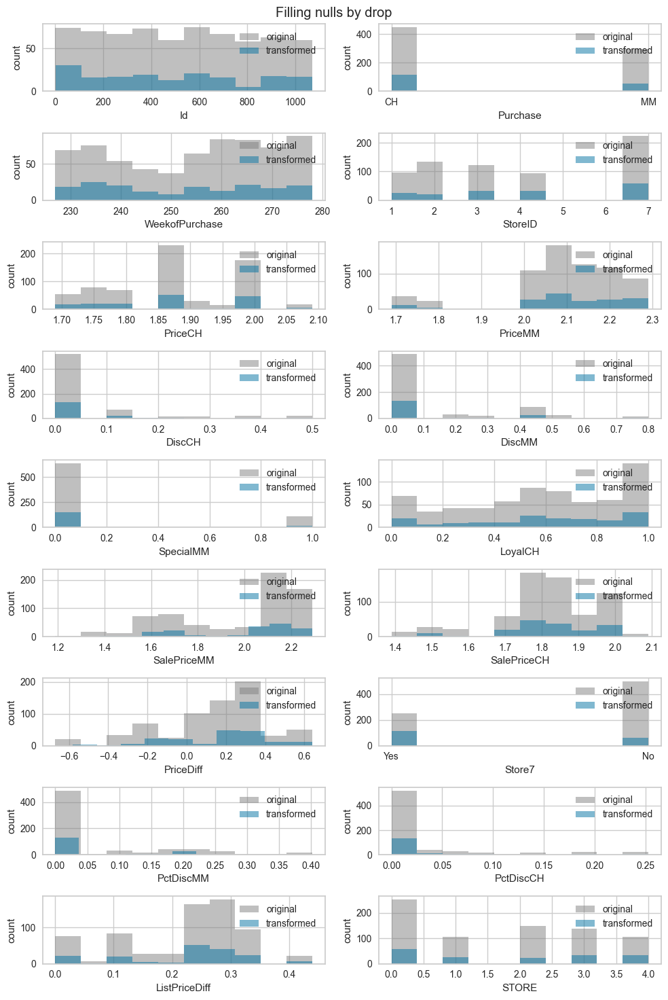

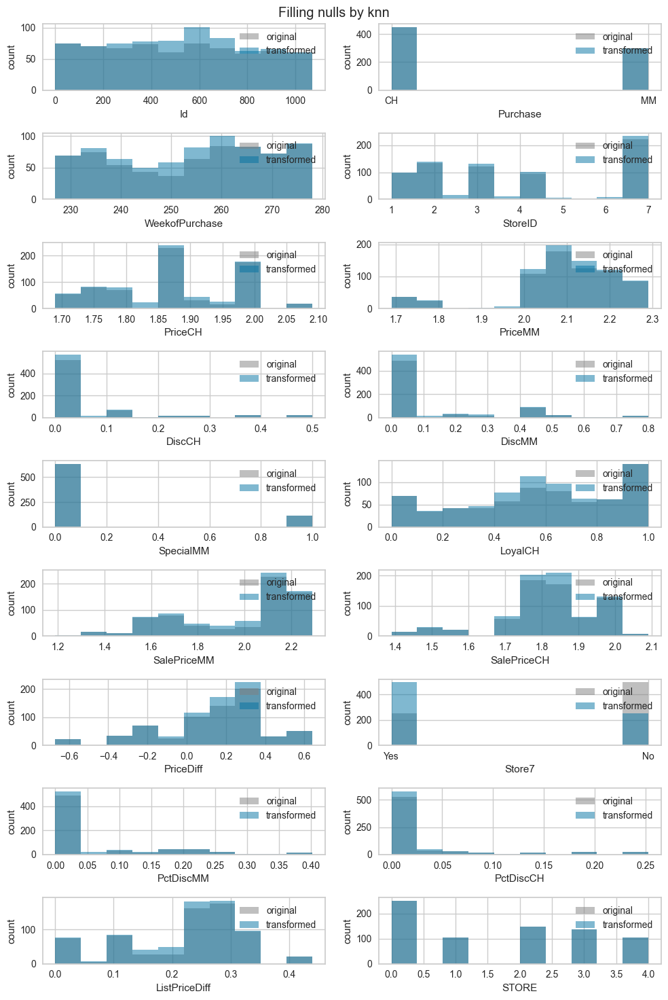

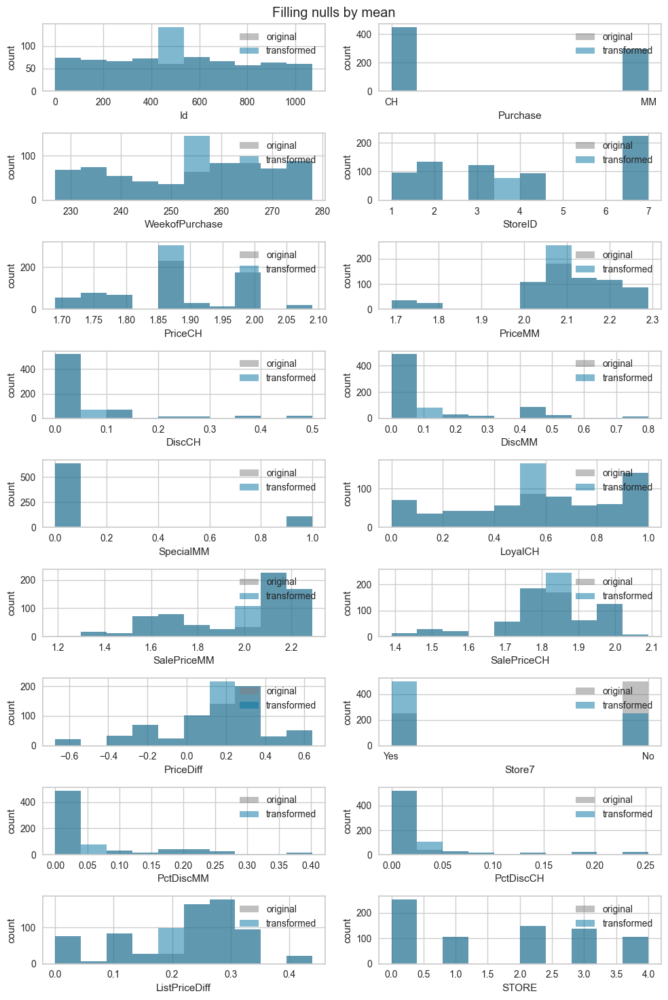

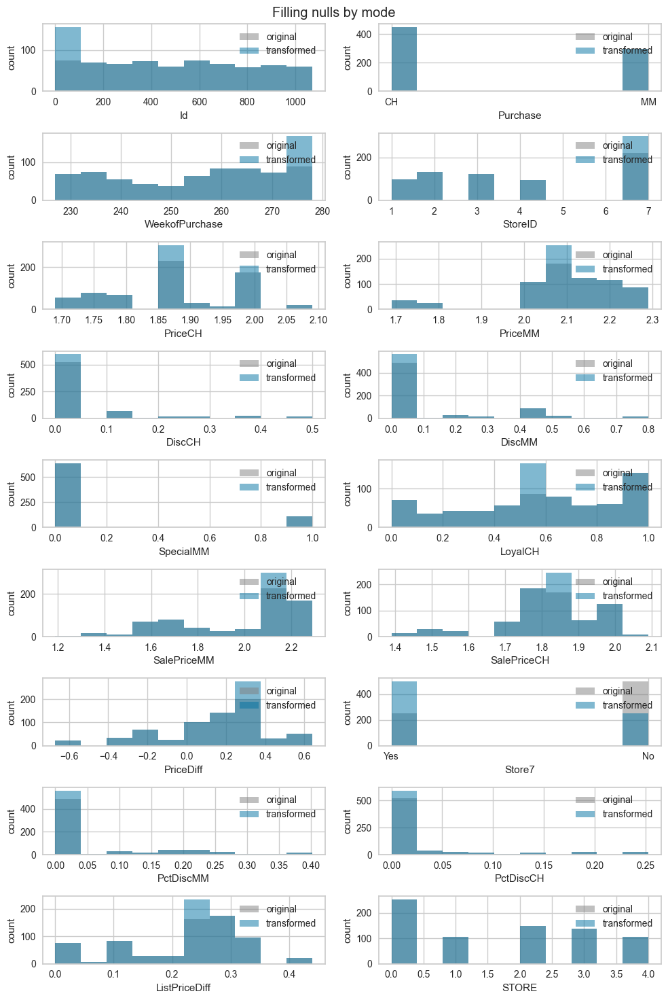

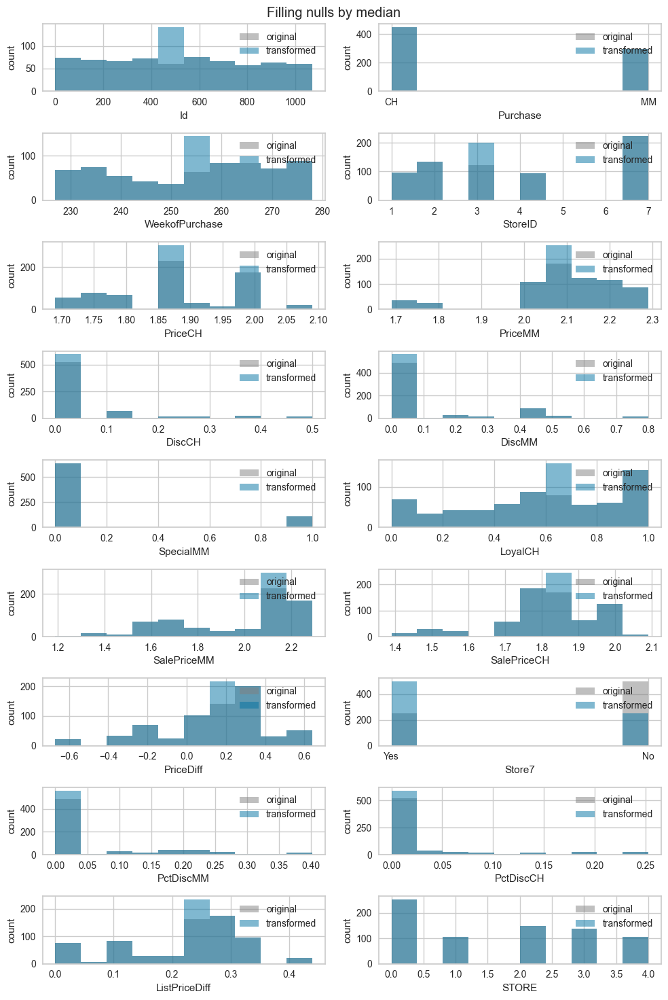

...

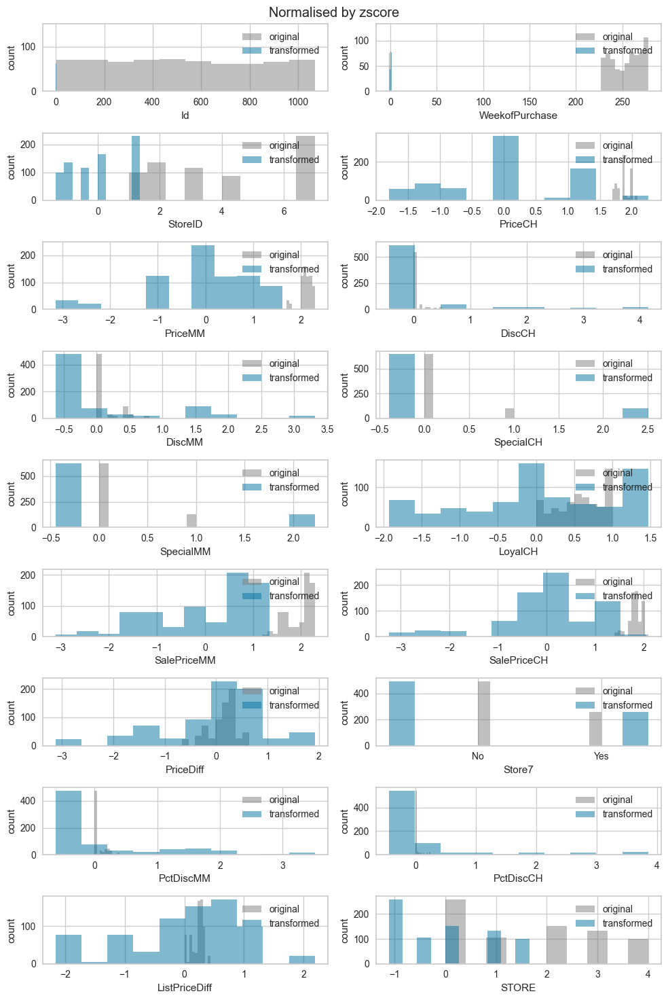

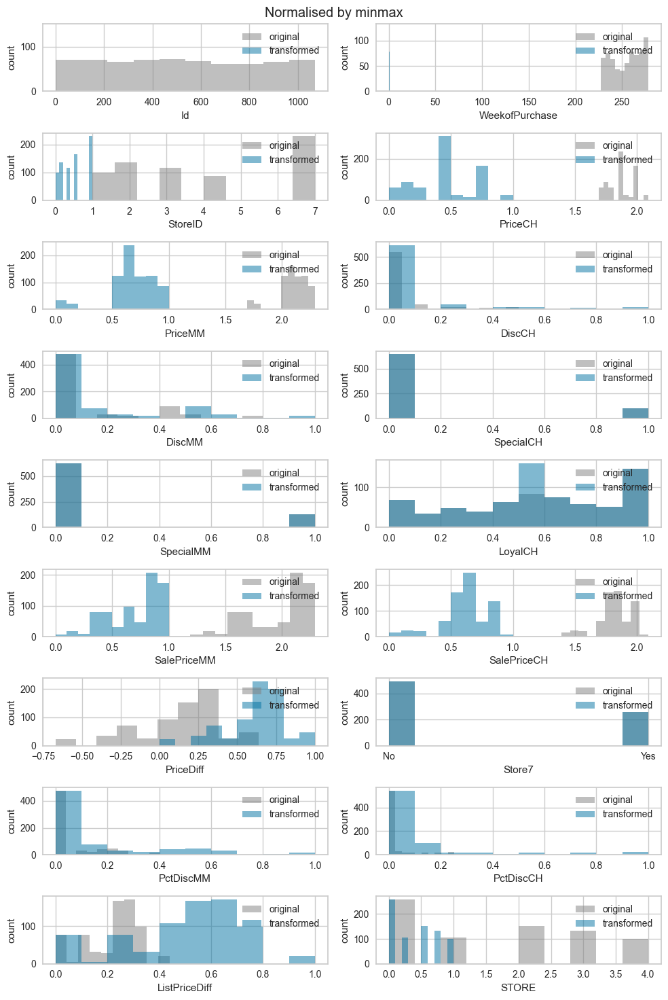

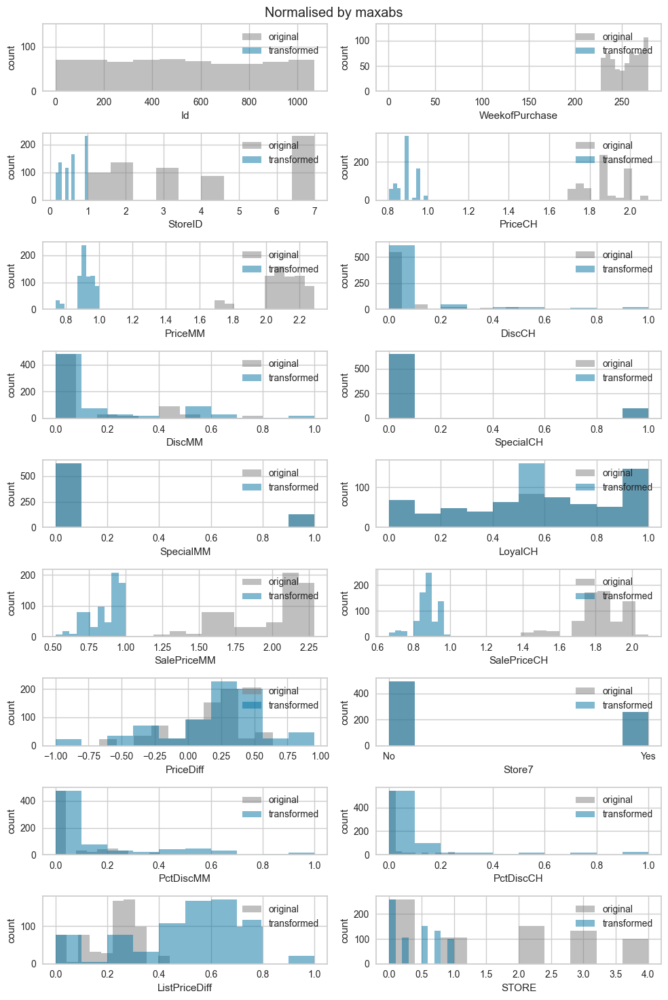

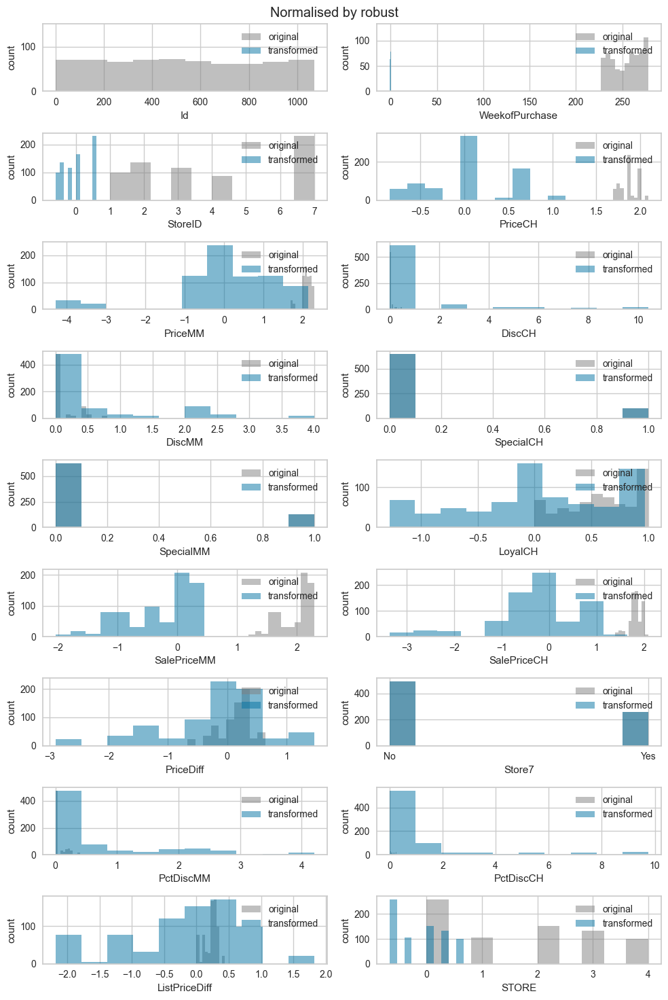

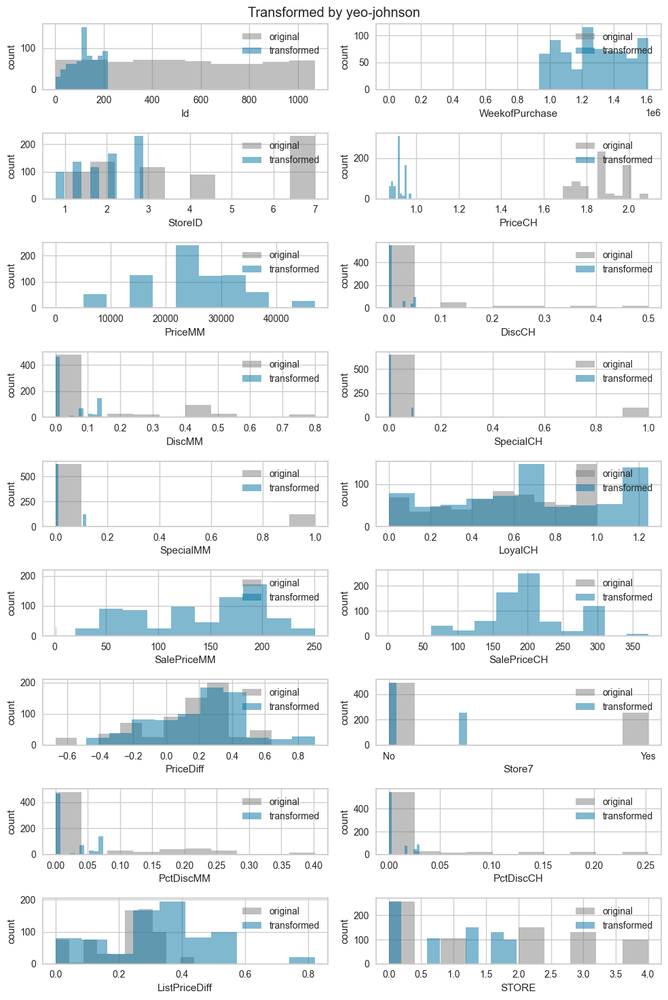

In [9]:
target_vars = ['SpecialCH', 'SpecialMM', 'Store7', 'Purchase']
multilabel_binary_experiment(data, target_vars, 'xgboost', experiment_id, pycaret_config, data_index='Id')